## Camera Calibration

In [1]:
# directory camera_cal
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
%matplotlib inline

nx = 9
ny = 6

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((ny*nx,3), np.float32)
objp[:,:2] = np.mgrid[0:nx, 0:ny].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('camera_cal/calibration*.jpg')

# Step through the list and search for chessboard corners
for idx, fname in enumerate(images):
    img = cv2.imread(fname)[...,::-1]
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (nx,ny), None)
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
#         cv2.drawChessboardCorners(img, (nx-1,ny), corners, ret)

/home/mahesh/anaconda2/envs/python3/lib/python3.5/site-packages/matplotlib/font_manager.py:273: UserWarning: Matplotlib is building the font cache using fc-list. This may take a moment.
  warnings.warn('Matplotlib is building the font cache using fc-list. This may take a moment.')
/home/mahesh/anaconda2/envs/python3/lib/python3.5/site-packages/matplotlib/font_manager.py:273: UserWarning: Matplotlib is building the font cache using fc-list. This may take a moment.
  warnings.warn('Matplotlib is building the font cache using fc-list. This may take a moment.')


In [2]:
print(objpoints[0][0])
print(imgpoints[0][0])

[ 0.  0.  0.]
[[  88.20872498  138.82823181]]


## Undistort Image

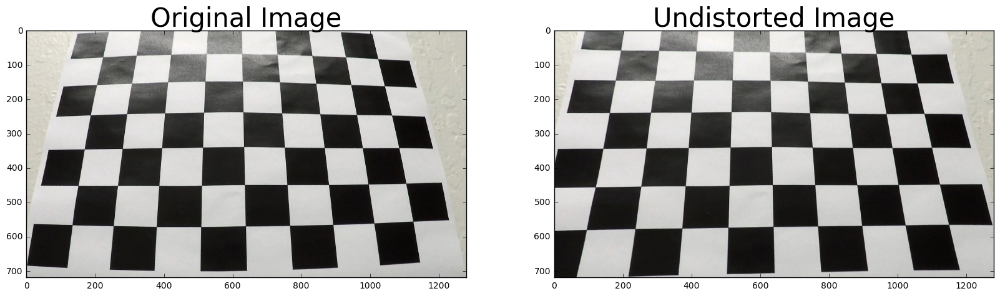

In [3]:
# img = cv2.imread('test_images/straight_lines1.jpg')[...,::-1]
img = cv2.imread('camera_cal/calibration3.jpg')[...,::-1]


def undistort_function(img, objpoints, imgpoints):

    img_size = (img.shape[1], img.shape[0])

    # Do camera calibration given object points and image points
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)

    return cv2.undistort(img, mtx, dist, None, mtx)

dst = undistort_function(img, objpoints, imgpoints)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(dst)
ax2.set_title('Undistorted Image', fontsize=30)

# im_crop = img[200:400, 100:400]
# plt.figure()
# plt.imshow(im_crop)


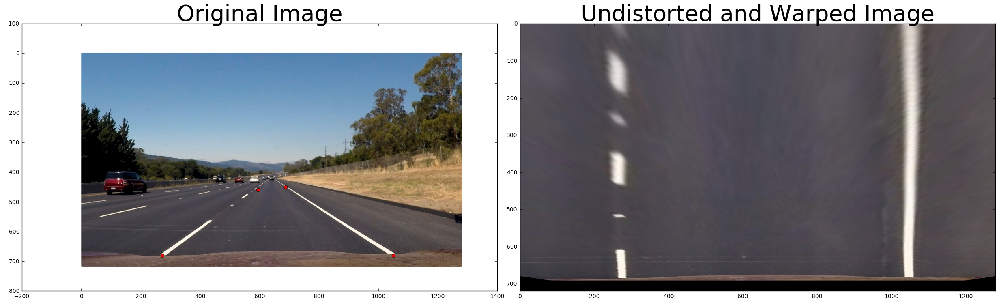

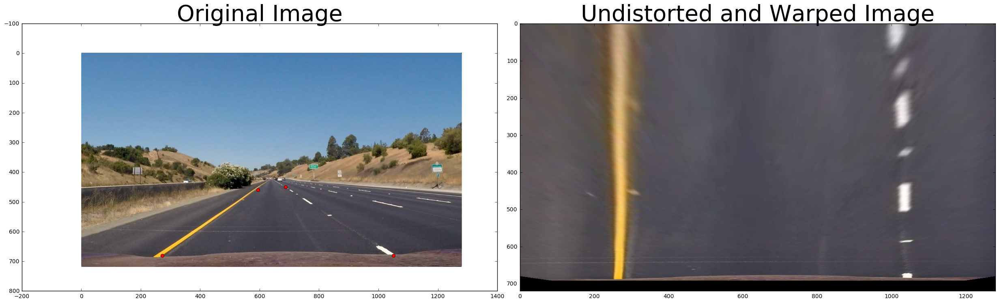

In [53]:
# mpig.imread(test)
import matplotlib.image as mpimg
img = mpimg.imread('test_images/straight_lines2.jpg')
img2 = mpimg.imread('test_images/straight_lines1.jpg')

undist = undistort_function(img, objpoints, imgpoints)

src = np.float32([[1047, 680], [688.2, 450], [596.5, 450], [272, 680]])
dst = np.float32([[1047, 680], [1047, 0], [272, 0] , [272, 680]])

M = cv2.getPerspectiveTransform(src, dst)
Minv = cv2.getPerspectiveTransform(dst, src)
warped = cv2.warpPerspective(undist, M, (img.shape[1], img.shape[0] ), flags=cv2.INTER_LINEAR)

def transform_function(image):
    return cv2.warpPerspective(undistort_function(image, objpoints, imgpoints), M, \
                               (img.shape[1], img.shape[0] ), flags=cv2.INTER_LINEAR)

warped2 = transform_function(img2)
    

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

ax1.imshow(img)
ax1.set_title('Original Image', fontsize=40)
ax1.plot(1051, 680, 'ro', linewidth=2.0)
ax1.plot(273, 680, 'ro', linewidth=2.0)
ax1.plot(687, 450, 'ro', linewidth=2.0)
ax1.plot(595, 460, 'ro', linewidth=2.0)

ax2.imshow(warped)
ax2.set_title('Undistorted and Warped Image', fontsize=40)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)


f2, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f2.tight_layout()

ax1.imshow(img2)
ax1.set_title('Original Image', fontsize=40)
ax1.plot(1051, 680, 'ro', linewidth=2.0)
ax1.plot(273, 680, 'ro', linewidth=2.0)
ax1.plot(687, 450, 'ro', linewidth=2.0)
ax1.plot(595, 460, 'ro', linewidth=2.0)

ax2.imshow(warped2)
ax2.set_title('Undistorted and Warped Image', fontsize=40)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

## Color and gradient threshold

In [24]:
def pipeline(img, s_thresh=(170, 220), sx_thresh=(15, 100)):
    img = np.copy(img)
    sy_thresh=(15, 100)
    h_thresh = (20, 36)
    h2_thresh = (35,45 )
    v2_thresh = (120, 255)
    
    y_thresh = (0,20)
    
    
    # Convert to HSV color space and separate the V channel
    hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HLS).astype(np.float)
    hsv2 = cv2.cvtColor(img, cv2.COLOR_RGB2HSV).astype(np.float)
    luv = cv2.cvtColor(img, cv2.COLOR_RGB2LUV).astype(np.float)
    
    ycbcr = cv2.cvtColor(img, cv2.COLOR_BGR2YCR_CB).astype(np.float)
    
    r_channel = img[:,:,0]
    g_channel = img[:,:,1]
    b_channel = img[:,:,2]
    
    h_channel = hsv[:,:,0]
    l_channel = hsv[:,:,1]
    s_channel = hsv[:,:,2]
    
    h2_channel = hsv2[:,:,0]
    s2_channel = hsv2[:,:,1]
    v2_channel = hsv2[:,:,2]
    
    l3_channel = luv[:,:,0]
    u3_channel = luv[:,:,1]
    v3_channel = luv[:,:,2]
    
    
    y_channel = ycbcr[:,:,0]
    cr_channel = ycbcr[:,:,1]
    cb_channel = ycbcr[:,:,2]
    
#     plt.figure()
#     plt.imshow(np.dstack(( np.zeros_like(v2_channel), l3_channel, l3_channel*0)))
    
# #     plt.figure()
# #     plt.imshow(img)
# # #     plt.figure()
# #     plt.imshow(np.dstack(( r_channel, y_channel*0, y_channel*0)))
    
#     plt.figure()
#     plt.imshow(np.dstack(( np.zeros_like(l_channel), y_channel, y_channel*0)))
    
#     plt.figure()
#     plt.imshow(np.dstack(( np.zeros_like(cr_channel), cb_channel, y_channel*0)))

#     plt.figure()
#     plt.imshow(np.dstack(( np.zeros_like(cb_channel), cr_channel, y_channel*0)))
    
#     s_channel = hsv[:,:,1]
#     v_channel = hsv[:,:,2]
    # Sobel x
    sobelx = cv2.Sobel(y_channel, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    
    sobely = cv2.Sobel(y_channel, cv2.CV_64F, 0, 1) # Take the derivative in x
    abs_sobely = np.absolute(sobely) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobely = np.uint8(255*abs_sobely/np.max(abs_sobely))
    
    # Threshold x gradient
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= sx_thresh[0]) & (scaled_sobel <= sx_thresh[1])] = 1
    
        # Threshold x gradient
    sybinary = np.zeros_like(scaled_sobel)
    sybinary[(scaled_sobely >= sx_thresh[0]) & (scaled_sobely <= sx_thresh[1])] = 1
    
#     plt.figure()
#     plt.imshow(np.dstack(( sxbinary*255, sxbinary*0, sxbinary*0)) )
    
#     plt.figure()
#     plt.imshow(np.dstack(( sybinary*255, sxbinary*0, sxbinary*0)) )
    
    hbinary = np.zeros_like(scaled_sobel)
    hbinary[(h_channel >= h_thresh[0]) & (h_channel <= h_thresh[1])] = 1

    hsvbinary = np.zeros_like(scaled_sobel)
    h2_thresh = (0,255)
    hsvbinary[(h2_channel >= h2_thresh[0]) & (h2_channel <= h2_thresh[1])\
             & (s2_channel >= 0  ) & (s2_channel <= 255) \
             & (v2_channel >= 0  ) & (v2_channel <= 255)] = 1
    
    rgbbinary = np.zeros_like(scaled_sobel)
    
    rgbbinary[(r_channel >= 220) & (g_channel >= 180 ) & (b_channel >= 180 )] = 1
    
#     plt.figure()
#     plt.imshow(np.dstack(( rgbbinary*0, hbinary, rgbbinary*0)) )
    
#     plt.figure()
#     plt.imshow(np.dstack(( rgbbinary*255, rgbbinary*0, rgbbinary*0)) )
    # Threshold x gradient
    sybinary = np.zeros_like(scaled_sobely)
    sybinary[(scaled_sobel >= sy_thresh[0]) & (scaled_sobel <= sy_thresh[1])] = 1
    
    # Threshold color channel
    y_binary = np.zeros_like(y_channel)
    y_binary[(y_channel >= y_thresh[0]) & (y_channel <= y_thresh[1])] = 1

    l3_thresh = (150, 170)
        # Threshold color channel
    l3_binary = np.zeros_like(l3_channel)
    l3_binary[(l3_channel >= l3_thresh[0]) & (l3_channel <= l3_thresh[1])\
             & (u3_channel >= 100  ) & (u3_channel <= 130) \
             & (v3_channel >= 155  ) & (v3_channel <= 200)] = 1
    
#     plt.figure()
#     plt.imshow(np.dstack(( rgbbinary*0, l3_binary, rgbbinary*0)) )

    
    # Threshold color channel
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 1
    # Stack each channel
    # Note color_binary[:, :, 0] is all 0s, effectively an all black image. It might
    # be beneficial to replace this channel with something else.
    color_binary = np.dstack(( np.zeros_like(scaled_sobely), sxbinary*255, hsvbinary*255))
    combined_binary = np.zeros_like(sxbinary)
#     combined_binary[ (l3_binary == 1) | (sxbinary == 1)] = 1
    combined_binary[ (l3_binary == 1) | (sxbinary == 1) | (s_binary == 1) | (rgbbinary == 1)] = 1
#      
#     return color_binary, combined_binary
    return combined_binary

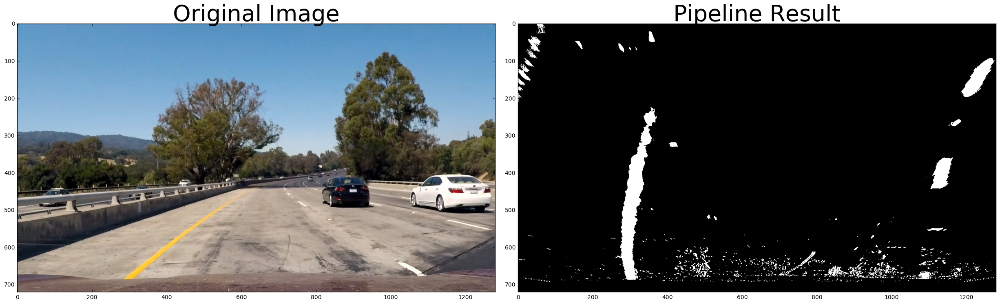

In [25]:
# Tune color and gradient selection:

img1 = cv2.imread('test_images/test1.jpg')[...,::-1]

imagelist = [img1]
img_dst = []
result_binary = []

result_transform = cv2.warpPerspective(undistort_function(imagelist[0], objpoints, imgpoints), M, \
                               (img.shape[1], img.shape[0] ), flags=cv2.INTER_LINEAR)

combined_binary = pipeline(result_transform,\
                                         (150, 255), (15, 100))



# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

ax1.imshow(imagelist[0])
ax1.set_title('Original Image', fontsize=40)

ax2.imshow(combined_binary, cmap='gray')
ax2.set_title('Pipeline Result', fontsize=40)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)



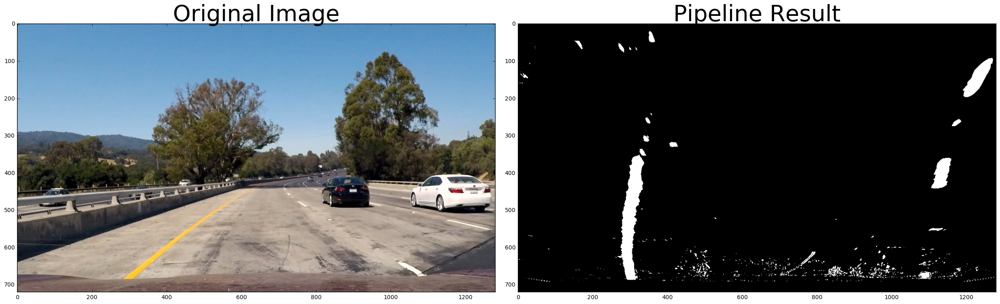

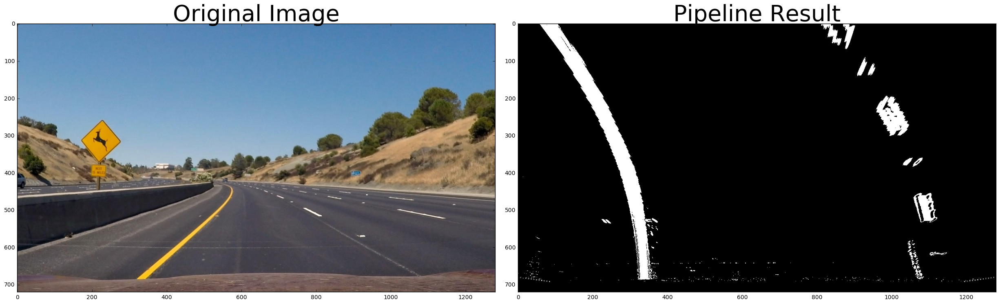

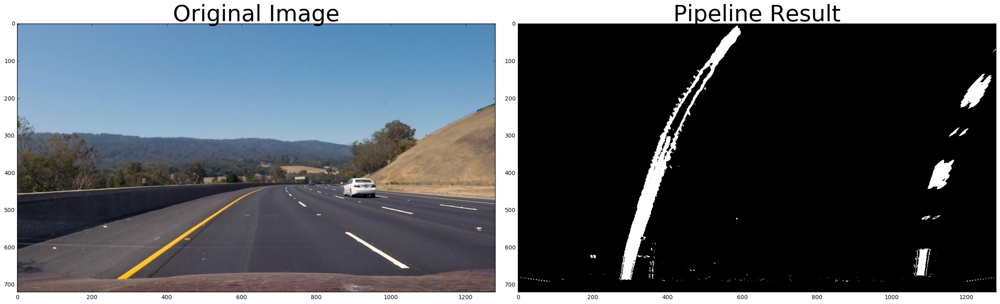

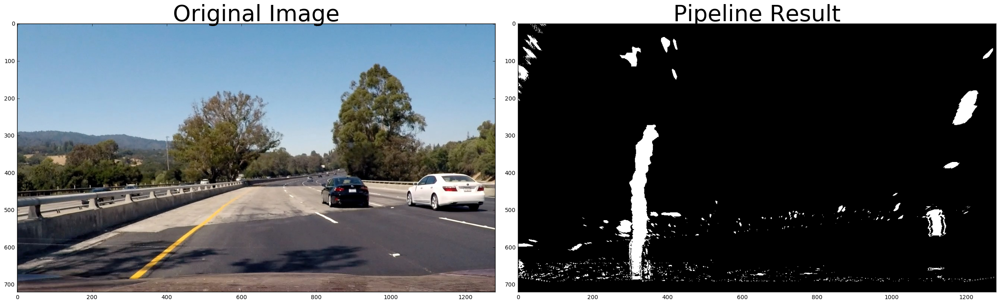

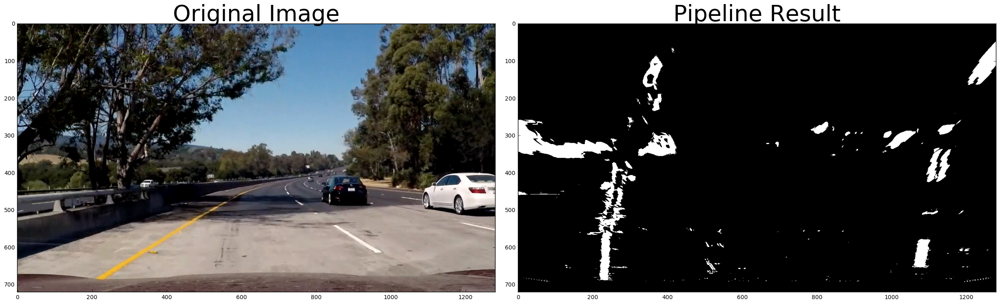

In [26]:
img1 = cv2.imread('test_images/test1.jpg')[...,::-1]
img2 = cv2.imread('test_images/test2.jpg')[...,::-1]
img3 = cv2.imread('test_images/test3.jpg')[...,::-1]
img4 = cv2.imread('test_images/test4.jpg')[...,::-1]
img5 = cv2.imread('test_images/test5.jpg')[...,::-1]
imagelist = [img1, img2, img3, img4, img5]
img_dst = []
result_binary = []

for i in range(len(imagelist)):
    
    
    img_dst.append(undistort_function(imagelist[i], objpoints, imgpoints))
    
    transform = cv2.warpPerspective(img_dst[i], M, \
                               (img.shape[1], img.shape[0] ), flags=cv2.INTER_LINEAR)
        
    result_binary.append(pipeline(transform, (160, 255), (20, 80)))

    # Plot the result
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()

    ax1.imshow(imagelist[i])
    ax1.set_title('Original Image', fontsize=40)

    ax2.imshow(result_binary[i],  cmap='gray')
    ax2.set_title('Pipeline Result', fontsize=40)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [ ]:
result_binary_masked = []
imshape = result_binary[0].shape
print(imshape)
vertices = np.array([[(imshape[1]/14,imshape[0]),(imshape[1]/2 - imshape[1]/15, imshape[0]/1.8), \
        (imshape[1]/2 + imshape[1]/15, imshape[0]/1.8), (imshape[1] - imshape[1]/14,imshape[0])]], dtype=np.int32) 

for img in result_binary:
    result_binary_masked.append(region_of_interest(img, vertices))
    
    
for i in range(len(result_binary)):
    # Plot the result
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()

    ax1.imshow(img_dst[i], cmap='gray')
    ax1.set_title('Original Image', fontsize=40)

    ax2.imshow(result_binary_masked[i], cmap='gray')
    ax2.set_title('Pipeline Result', fontsize=40)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)


## Perspective Transform

In [ ]:
result_binary_transform = []
for image in result_binary_masked:
    
#     transformed = cv2.warpPerspective(undistort_function(image, objpoints, imgpoints), M, \
#                                (img.shape[1], img.shape[0] ), flags=cv2.INTER_LINEAR)
    transformed = cv2.warpPerspective(image, M, \
                               (img.shape[1], img.shape[0] ), flags=cv2.INTER_LINEAR)
    result_binary_transform.append(transformed)
    
    
    # Plot the result
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()

    ax1.imshow(image, cmap='gray')
    ax1.set_title('Original Image', fontsize=40)

    ax2.imshow(result_binary_transform[-1], cmap='gray')
    ax2.set_title('Pipeline Result', fontsize=40)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [ ]:
img = result_binary_transform[2]
for img in result_binary_transform:
    histogram = np.sum(img[img.shape[0]//2:,:], axis=0)
    plt.figure()
    plt.plot(histogram)

## Sliding Windows

In [ ]:
# import numpy as np
# import cv2
# import matplotlib.pyplot as plt

binary_warped = result_binary_transform[3]

# Assuming you have created a warped binary image called "binary_warped"
# Take a histogram of the bottom half of the image
histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
# Create an output image to draw on and  visualize the result
out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
# Find the peak of the left and right halves of the histogram
# These will be the starting point for the left and right lines
midpoint = np.int(histogram.shape[0]/2)
leftx_base = np.argmax(histogram[:midpoint])
rightx_base = np.argmax(histogram[midpoint:]) + midpoint

# Choose the number of sliding windows
nwindows = 9
# Set height of windows
window_height = np.int(binary_warped.shape[0]/nwindows)
# Identify the x and y positions of all nonzero pixels in the image
nonzero = binary_warped.nonzero()
nonzeroy = np.array(nonzero[0])
nonzerox = np.array(nonzero[1])
# Current positions to be updated for each window
leftx_current = leftx_base
rightx_current = rightx_base
# Set the width of the windows +/- margin
margin = 50
# Set minium number of pixels found to recenter window
minpix = 50
# Create empty lists to receive left and right lane pixel indices
left_lane_inds = []
right_lane_inds = []

# Step through the windows one by one
for window in range(nwindows):
    # Identify window boundaries in x and y (and right and left)
    win_y_low = binary_warped.shape[0] - (window+1)*window_height
    win_y_high = binary_warped.shape[0] - window*window_height
    win_xleft_low = leftx_current - margin
    win_xleft_high = leftx_current + margin
    win_xright_low = rightx_current - margin
    win_xright_high = rightx_current + margin
    # Draw the windows on the visualization image
    cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
    cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 
    # Identify the nonzero pixels in x and y within the window
    good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
    good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
    # Append these indices to the lists
    left_lane_inds.append(good_left_inds)
    right_lane_inds.append(good_right_inds)
    # If you found > minpix pixels, recenter next window on their mean position
    if len(good_left_inds) > minpix:
#         left_lane_inds.append(good_left_inds)
        leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
    if len(good_right_inds) > minpix:  
#         right_lane_inds.append(good_right_inds)
        rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

# Concatenate the arrays of indices
left_lane_inds = np.concatenate(left_lane_inds)
right_lane_inds = np.concatenate(right_lane_inds)

# Extract left and right line pixel positions
leftx = nonzerox[left_lane_inds]
lefty = nonzeroy[left_lane_inds] 
rightx = nonzerox[right_lane_inds]
righty = nonzeroy[right_lane_inds] 

# Fit a second order polynomial to each
left_fit = np.polyfit(lefty, leftx, 2)
right_fit = np.polyfit(righty, rightx, 2)

In [40]:
# Mask outer image
def region_of_interest(img, vertices):
    """
    Applies an image mask.
    
    Only keeps the region of the image defined by the polygon
    formed from `vertices`. The rest of the image is set to black.
    """
    #defining a blank mask to start with
    mask = np.zeros_like(img)   
    
    #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image

def sliding_initial(binary_warped):
    # Assuming you have created a warped binary image called "binary_warped"
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 50
    # Set minium number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
#             left_lane_inds.append(good_left_inds)
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:    
#             right_lane_inds.append(good_right_inds)
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*0

    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
    
    
    
    return left_fit, right_fit, out_img
    
def skip_sliding_next_frame(binary_warped, left_fit, right_fit ):
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 100
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] + margin))) 
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] + margin)))  

    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    
def draw_lines(img, lines, color=[255, 0, 0], thickness=2):
    for line in lines:
        for x1,y1,x2,y2 in line:
            cv2.line(img, (x1, y1), (x2, y2), color, thickness)
            
def find_curvature(left_fit, right_fit, ylen):
        # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    
    ploty = np.linspace(0, ylen-1, ylen )
    y_eval = np.max(ploty)
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(ploty*ym_per_pix, left_fitx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty*ym_per_pix, right_fitx*xm_per_pix, 2)
    # Calculate the new radii of curvature
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    # Now our radius of curvature is in meters
    return [left_curverad, right_curverad]

In [41]:
def process_image(image):
    
    undist_image = undistort_function(image, objpoints, imgpoints)
    
    imshape = image.shape[:2]
    
#     color gradient threshold pipeline
    vertices = np.array([[(imshape[1]/14,imshape[0]),(imshape[1]/2 - imshape[1]/15, imshape[0]/1.8), \
        (imshape[1]/2 + imshape[1]/15, imshape[0]/1.8), (imshape[1] - imshape[1]/14,imshape[0])]], dtype=np.int32) 


    undist_image_masked = (region_of_interest(undist_image, vertices))
    
    undist_image_transform = cv2.warpPerspective(undist_image_masked, M, \
                               (image.shape[1], image.shape[0] ), flags=cv2.INTER_LINEAR)


    
    thresh_binary = pipeline(undist_image_transform, (160, 255), (20, 80))
    

#     imshape = thresh_binary.shape

#     vertices = np.array([[(imshape[1]/14,imshape[0]),(imshape[1]/2 - imshape[1]/15, imshape[0]/1.8), \
#         (imshape[1]/2 + imshape[1]/15, imshape[0]/1.8), (imshape[1] - imshape[1]/14,imshape[0])]], dtype=np.int32) 


#     result_binary_masked = (region_of_interest(thresh_binary, vertices))
    
    result_binary_transform = thresh_binary
    binary_warped = thresh_binary
    
#     result_binary_transform = cv2.warpPerspective(result_binary_masked, M, \
#                                (img.shape[1], img.shape[0] ), flags=cv2.INTER_LINEAR)
    
    left_fit, right_fit, lane_image = sliding_initial(result_binary_transform)
    
    curvature_out = np.int32(find_curvature(left_fit, right_fit, imshape[0]))
    


    
#     out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    border_width = 8
    
    left_points =  np.array([[x - border_width,y] for x,y in zip(left_fitx, ploty)])
    right_points = np.array([[x + border_width,y] for x,y in zip(right_fitx, ploty)])
    
    combined_points = np.concatenate([left_points, right_points[::-1]])
    
    lane_fill = np.copy(image)*0
    

#     cv2.polylines(lane_image, np.int32([left_points]), 0, (255, 0, 0), 20)
#     cv2.polylines(lane_image, np.int32([right_points]), 0, (0, 0, 255), 20)
    
    cv2.fillPoly(lane_fill, np.int32([combined_points]), (0,128, 0))
    
    lane_image = cv2.addWeighted(lane_image, 1, lane_fill, 1, 0)
    
    lane_image_unwarp = cv2.warpPerspective(lane_image, Minv, \
                                   (lane_image.shape[1], lane_image.shape[0] ), flags=cv2.INTER_LINEAR) 

    combined_undist = cv2.addWeighted(undist_image, 0.8, lane_image_unwarp, 1, 0)
    

    font = cv2.FONT_HERSHEY_SIMPLEX
    curvature_text = 'Radius of Curvature = ' + curvature_out[0].astype('str') + ' (m)'

    combined_undist = cv2.putText(combined_undist,curvature_text,(50,50), font, 1.5,(255,255,255),2,cv2.LINE_AA)

    return combined_undist


In [42]:
# Test process Image

combined_undist_1 = process_image(imagelist[1])



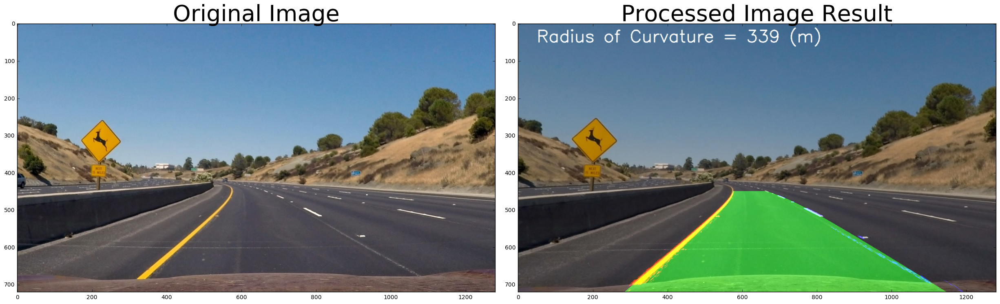

In [43]:
f3, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f3.tight_layout()

ax1.imshow(imagelist[1])
ax1.set_title('Original Image', fontsize=40)

ax2.imshow(combined_undist_1)
# ax2.imshow(processed_image, cmap='gray')
ax2.set_title('Processed Image Result', fontsize=40)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

## Visualization

In [ ]:
# Generate x and y values for plotting
ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
plt.imshow(out_img)
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')
plt.xlim(0, 1280)
plt.ylim(720, 0)

## Skip the sliding windows for next images

In [ ]:
# from the next frame of video (also called "binary_warped")
# It's now much easier to find line pixels!
nonzero = binary_warped.nonzero()
nonzeroy = np.array(nonzero[0])
nonzerox = np.array(nonzero[1])
margin = 100
left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] + margin))) 
right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] + margin)))  

# Again, extract left and right line pixel positions
leftx = nonzerox[left_lane_inds]
lefty = nonzeroy[left_lane_inds] 
rightx = nonzerox[right_lane_inds]
righty = nonzeroy[right_lane_inds]
# Fit a second order polynomial to each
left_fit = np.polyfit(lefty, leftx, 2)
right_fit = np.polyfit(righty, rightx, 2)
# Generate x and y values for plotting
ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

In [ ]:
# Create an image to draw on and an image to show the selection window
out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
window_img = np.zeros_like(out_img)
# Color in left and right line pixels
out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

# Generate a polygon to illustrate the search window area
# And recast the x and y points into usable format for cv2.fillPoly()
left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, ploty])))])
left_line_pts = np.hstack((left_line_window1, left_line_window2))
right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, ploty])))])
right_line_pts = np.hstack((right_line_window1, right_line_window2))

# Draw the lane onto the warped blank image
cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
plt.imshow(result)
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')
plt.xlim(0, 1280)
plt.ylim(720, 0)

## Curvature

In [ ]:
print(ploty.shape)
print(rightx.shape)

In [ ]:
# Plot up the fake data
mark_size = 3
# plt.plot(leftx, ploty, 'o', color='red', markersize=mark_size)
# plt.plot(rightx, ploty, 'o', color='blue', markersize=mark_size)
# plt.xlim(0, 1280)
# plt.ylim(0, 720)
plt.plot(left_fitx, ploty, color='green', linewidth=3)
plt.plot(right_fitx, ploty, color='green', linewidth=3)
plt.gca().invert_yaxis() # to visualize as we do the images

# Define y-value where we want radius of curvature
# I'll choose the maximum y-value, corresponding to the bottom of the image
y_eval = np.max(ploty)
left_curverad = ((1 + (2*left_fit[0]*y_eval + left_fit[1])**2)**1.5) / np.absolute(2*left_fit[0])
right_curverad = ((1 + (2*right_fit[0]*y_eval + right_fit[1])**2)**1.5) / np.absolute(2*right_fit[0])
print(left_curverad, right_curverad)

# Define conversions in x and y from pixels space to meters
ym_per_pix = 30/720 # meters per pixel in y dimension
xm_per_pix = 3.7/700 # meters per pixel in x dimension

# Fit new polynomials to x,y in world space
left_fit_cr = np.polyfit(ploty*ym_per_pix, left_fitx*xm_per_pix, 2)
right_fit_cr = np.polyfit(ploty*ym_per_pix, right_fitx*xm_per_pix, 2)
# Calculate the new radii of curvature
left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
# Now our radius of curvature is in meters
print(left_curverad, 'm', right_curverad, 'm')
# Example values: 632.1 m    626.2 m

## Convolution sliding windows

In [ ]:
# import numpy as np
# import matplotlib.pyplot as plt
# import matplotlib.image as mpimg
# import glob
# import cv2

# # Read in a thresholded image
# # warped = mpimg.imread('warped_example.jpg')
# warped = result_binary_transform[3]
# # window settings
# window_width = 50 
# window_height = 80 # Break image into 9 vertical layers since image height is 720
# margin = 100 # How much to slide left and right for searching

# def window_mask(width, height, img_ref, center,level):
#     output = np.zeros_like(img_ref)
#     output[int(img_ref.shape[0]-(level+1)*height):int(img_ref.shape[0]-level*height),max(0,int(center-width/2)):min(int(center+width/2),img_ref.shape[1])] = 1
#     return output

# def find_window_centroids(image, window_width, window_height, margin):
    
#     window_centroids = [] # Store the (left,right) window centroid positions per level
#     window = np.ones(window_width) # Create our window template that we will use for convolutions
    
#     # First find the two starting positions for the left and right lane by using np.sum to get the vertical image slice
#     # and then np.convolve the vertical image slice with the window template 
    
#     # Sum quarter bottom of image to get slice, could use a different ratio
#     l_sum = np.sum(warped[int(3*warped.shape[0]/4):,:int(warped.shape[1]/2)], axis=0)
#     l_center = np.argmax(np.convolve(window,l_sum))-window_width/2
#     r_sum = np.sum(warped[int(3*warped.shape[0]/4):,int(warped.shape[1]/2):], axis=0)
#     r_center = np.argmax(np.convolve(window,r_sum))-window_width/2+int(warped.shape[1]/2)
    
#     # Add what we found for the first layer
#     window_centroids.append((l_center,r_center))
    
#     # Go through each layer looking for max pixel locations
#     for level in range(1,(int)(warped.shape[0]/window_height)):
#         # convolve the window into the vertical slice of the image
#         image_layer = np.sum(warped[int(warped.shape[0]-(level+1)*window_height):int(warped.shape[0]-level*window_height),:], axis=0)
#         conv_signal = np.convolve(window, image_layer)
#         # Find the best left centroid by using past left center as a reference
#         # Use window_width/2 as offset because convolution signal reference is at right side of window, not center of window
#         offset = window_width/2
#         l_min_index = int(max(l_center+offset-margin,0))
#         l_max_index = int(min(l_center+offset+margin,warped.shape[1]))
#         l_center = np.argmax(conv_signal[l_min_index:l_max_index])+l_min_index-offset
#         # Find the best right centroid by using past right center as a reference
#         r_min_index = int(max(r_center+offset-margin,0))
#         r_max_index = int(min(r_center+offset+margin,warped.shape[1]))
#         r_center = np.argmax(conv_signal[r_min_index:r_max_index])+r_min_index-offset
#         # Add what we found for that layer
#         window_centroids.append((l_center,r_center))

#     return window_centroids

# window_centroids = find_window_centroids(warped, window_width, window_height, margin)

# # If we found any window centers
# if len(window_centroids) > 0:

#     # Points used to draw all the left and right windows
#     l_points = np.zeros_like(warped)
#     r_points = np.zeros_like(warped)

#     # Go through each level and draw the windows 	
#     for level in range(0,len(window_centroids)):
#         # Window_mask is a function to draw window areas
#         l_mask = window_mask(window_width,window_height,warped,window_centroids[level][0],level)
#         r_mask = window_mask(window_width,window_height,warped,window_centroids[level][1],level)
#         # Add graphic points from window mask here to total pixels found 
#         l_points[(l_points == 255) | ((l_mask == 1) ) ] = 255
#         r_points[(r_points == 255) | ((r_mask == 1) ) ] = 255

#     # Draw the results
#     template = np.array(r_points+l_points,np.uint8) # add both left and right window pixels together
#     zero_channel = np.zeros_like(template) # create a zero color channle 
#     template = np.array(cv2.merge((zero_channel,template,zero_channel)),np.uint8) # make window pixels green
#     warpage = np.array(cv2.merge((warped,warped,warped)),np.uint8) # making the original road pixels 3 color channels
#     output = cv2.addWeighted(warpage, 1, template, 0.5, 0.0) # overlay the orignal road image with window results
 
#     # If no window centers found, just display orginal road image
# else:
#     output = np.array(cv2.merge((warped,warped,warped)),np.uint8)

# # Display the final results
# plt.imshow(output)
# plt.title('window fitting results')
# plt.show()


## Line Class

In [ ]:
class Line():
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False  
        # x values of the last n fits of the line
        self.recent_xfitted = [] 
        #average x values of the fitted line over the last n iterations
        self.bestx = None     
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None  
        #polynomial coefficients for the most recent fit
        self.current_fit = [np.array([False])]  
        #radius of curvature of the line in some units
        self.radius_of_curvature = None 
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        #x values for detected line pixels
        self.allx = None  
        #y values for detected line pixels
        self.ally = None

## Apply pipeline to video stream

In [44]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [45]:
P4_output = 'P4_output_04.mp4'
clip1 = VideoFileClip("project_video.mp4").subclip(38,45)
project_video_out_01 = clip1.fl_image(process_image) #NOTE: this function expects color images!!
%time project_video_out_01.write_videofile(P4_output, audio=False)

[MoviePy] >>>> Building video P4_output_04.mp4
[MoviePy] Writing video P4_output_04.mp4


 99%|█████████▉| 175/176 [06:14<00:02,  2.06s/it]


[MoviePy] Done.
[MoviePy] >>>> Video ready: P4_output_04.mp4 

CPU times: user 11min 24s, sys: 31.4 s, total: 11min 55s
Wall time: 6min 17s


In [51]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(P4_output))